### Experiment Tracking


*We will make many models while we're working & need to track their performance so that we know which of our models performed best?*

**How do I track my ML Experiment?**

In [1]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.0.1+cu118
0.15.2+cu118


In [2]:

# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine
     

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 3812, done.
remote: Counting objects: 100% (455/455), done.
remote: Compressing objects: 100% (271/271), done.
remote: Total 3812 (delta 238), reused 352 (delta 177), pack-reused 3357
Receiving objects: 100% (3812/3812), 650.13 MiB | 19.24 MiB/s, done.
Resolving deltas: 100% (2194/2194), done.
Updating files: 100% (248/248), done.


In [3]:
import os

old_name = r"./going_modular"
new_name = r"./scripts"
os.rename(old_name, new_name)   

In [4]:
old_name = r"./scripts/going_modular"
new_name = r"./scripts/scripts"
os.rename(old_name, new_name)

In [5]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [6]:
# Check the GPU
!nvidia-smi

Wed May 24 11:07:17 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

### Get Data

In [8]:
# Make a helper function to download data


import os
import zipfile

from pathlib import Path

import requests

def download_data(source:str,
                  destination:str,
                  remove_source: bool = True) -> Path:
  """
  Downloads a zipped dataset from source and unzips to destination
  """

  # Setup path to data folder
  data_path = Path("data/")
  image_path = data_path/destination

  # If data path doesnot exist, create one
  if data_path.is_dir():
    print(f"[INFO] {data_path} already exists, Not going to create again")
  else:
    print(f"[INFO] {data_path} doesnot exist. Creating ...")
    os.mkdir("data")

  # If image path doesn't exist, download it and prepare it
  if image_path.is_dir():
    print(f"[INFO] {image_path} directory exists, skipping re-download")
  else:
    print(f"[INFO] Didnot found {image_path}, downloading it .....")
    
    # Download the target data
    target_file = Path(source).name
    with open(data_path/target_file, "wb") as f:
      request = requests.get(source)
      print("Downloading .......")
      f.write(request.content)

    # Unzip
    with zipfile.ZipFile(data_path/target_file, "r") as zip_ref:
      print(f"[INFO] Unzipping {target_file} data ...")
      zip_ref.extractall(image_path)

    # Remove .zip file if needed
    if remove_source:
      os.remove(data_path/target_file)

  return image_path

In [9]:
source_path = "https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip"
image_path = download_data(source = source_path,
                           destination = "pizza_steak_sushi")

[INFO] data doesnot exist. Creating ...
[INFO] Didnot found data/pizza_steak_sushi, downloading it .....
[INFO] Unzipping pizza_steak_sushi.zip data ...


In [10]:
image_path

PosixPath('data/pizza_steak_sushi')

In [11]:
# Setup directory path

train_dir = image_path/ "train"
test_dir = image_path/ "test"

In [12]:
train_dir, test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'))

### Image folders to Datasets and DataLoaders

Here, we are using transfer learning. <br>

A point to remember while using a pretrained model is that the data we pass through the model is transformed the same way the training data was passed while training the model.<br>

`torchvision.models` contains pretrained models (models ready for transfer learning).

#### Creating transforms for `torchvision.models` using automatic data transform creation



*   Get a set of pretrained model weights. Here, in our case, we'll use `EfficientNet_BO_Weights`.



In [13]:
## Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT  # "DEFAULT" = best available weights

In [14]:
# Check the weights object
weights

EfficientNet_B0_Weights.IMAGENET1K_V1

Now, we can get the transforms by just calling the `.transforms()` method.

In [15]:
auto_transforms = weights.transforms()

In [16]:
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

#### Creating DataLoaders using automatic transforms

In [17]:
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir, test_dir = test_dir, transform = auto_transforms, batch_size = 32)

In [18]:
train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7ff21432e410>,
 ['pizza', 'steak', 'sushi'])

### Choosing the best pretrained model

There are thousands of pretrained models, but how to know which one is perfect  for us.

We consider 3 things before selecting a pretrained model.
1. Speed
2. Size
3. Performance

We have chosen `Efficient_Net_B0` by looking at performance to parameters ratio.

#### Setting up Pretrained model.

In [19]:
# Create a pretrained model
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT      # "DEFAULT" = best available weights

# Setting up the model
model = torchvision.models.efficientnet_b0(weights = weights).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 101MB/s]


In [20]:
# Let's check the model
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

### Feature Extraction

In [21]:
# Getting a summary of our model with torchinfo
from torchinfo import summary

summary(model = model, 
        input_size = (1, 3, 224, 224),  # batch_size = (batch_size, color channels, height, width)
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width = 20,
        row_settings = ["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 1000]            --                   True
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1280, 7, 7]      --                   True
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   True
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    864                  True
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    64                   True
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 16, 112,

Right now, all the parameters of our models are trainable. But, we'd like to only train the `sequential` layer. So, we need to convert `Trainable` to `False` for rest of the layers.

In [22]:
# Freezing the base model and changing the output layer to suit our needs
for param in model.features.parameters():
  param.requires_grad = False

In [23]:
summary(model = model, 
        input_size = (1, 3, 224, 224),  # batch_size = (batch_size, color channels, height, width)
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width = 20,
        row_settings = ["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 1000]            --                   Partial
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1280, 7, 7]      --                   False
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   False
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    (864)                False
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    (64)                 False
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 1

In [24]:
from torch import nn

torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Update the classifier head of pretrained model to suit our model architecture

model.classifier = nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True),
               nn.Linear(in_features = 1280,
              out_features = len(class_names))).to(device)


model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

In [25]:
summary(model = model, 
        input_size = (1, 3, 224, 224),  # batch_size = (batch_size, color channels, height, width)
        col_names = ["input_size", "output_size", "num_params", "trainable"],
        col_width = 20,
        row_settings = ["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 3]               --                   Partial
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1280, 7, 7]      --                   False
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   False
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    (864)                False
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    (64)                 False
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 1

### Training a model and tracking the results

In [26]:
# Define the loss and optimizer

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

To track experiments, we will be using TensorBoard. Here, we can use PyTorchs' `SummaryWriter`.

In [27]:
# Setup a summaryWriter
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()
writer

In [28]:
# Creating train function
import torch

from tqdm.auto import tqdm
from typing import Dict, List, Tuple

from scripts.scripts.engine import train_step, test_step

def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for 
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]} 
    For example if training for epochs=2: 
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]} 
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }
    
    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        # New: Experiment Tracking
        writer.add_scalars(main_tag = 'Loss',
                           tag_scalar_dict = {"train_loss" : train_loss,
                                              "test_loss" : test_loss},
                           global_step = epoch)
        
        writer.add_scalars(main_tag = 'Accuracy',
                           tag_scalar_dict = {"train_acc":train_acc,
                                              "test_acc":test_acc},
                           global_step = epoch)
        
        writer.add_graph(model = model,
                         input_to_model = torch.randn(32, 3, 224, 224).to(device))
        
    # Close the writer
    writer.close()

    # Return the filled results at the end of the epochs
    return results


In [29]:
# Train model

results = train(model = model,
                train_dataloader = train_dataloader,
                test_dataloader = test_dataloader,
                optimizer = optimizer,
                loss_fn = loss_fn,
                epochs = 5,
                device = device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0376 | train_acc: 0.5156 | test_loss: 0.9182 | test_acc: 0.5407
Epoch: 2 | train_loss: 0.9122 | train_acc: 0.6055 | test_loss: 0.8267 | test_acc: 0.6212
Epoch: 3 | train_loss: 0.7879 | train_acc: 0.7070 | test_loss: 0.6979 | test_acc: 0.8561
Epoch: 4 | train_loss: 0.6957 | train_acc: 0.7734 | test_loss: 0.5872 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6573 | train_acc: 0.7617 | test_loss: 0.5774 | test_acc: 0.8968


### View model's results with TensorBoard

In [30]:
%load_ext tensorboard

In [31]:
# Let's view our experiments from within the notebook
# I was using this on brave browser and to make it work we will have to give access to all cookies and turn off sheilds for colab.research.google.com
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### Creating a function to prepare `SummaryWriter()` instance

By default, `SummaryWriter()` class saves to `log_dir`.

How about if we wanted to save different experiments to different folders?

In essence, one experiment = one folder

For Example, we'd like to track:
* Experiment data/timestamp
* Experiment name
* Model name
* Extra - is there anything else that should be tracked?


Let's create a function to create a SummaryWriter() instance to take all of these things into account.

So, ideally we end up tracking experiments to a directory:
`runs/YYYY-MM-DD/experiment_name/model_name/extra`

In [32]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name:str,
                  model_name:str,
                  extra:str = None):
  """
  Creates a torch.utils.tensorboard.writer.SummaryWriter() instance tracking 
  to a specific directory.
  """
  from datetime import datetime
  import os

  # Get timestamp of curent date
  timestamp = datetime.now().strftime("%Y-%m-%d")

  if extra:
    # Create log directory path
    log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

  print(f"[INFO] Created SummaryWriter saving tp {log_dir}")
  return SummaryWriter(log_dir = log_dir)

### Update train() to use create_writer()...

In [33]:
# Creating train function
import torch

from tqdm.auto import tqdm
from typing import Dict, List, Tuple

from scripts.scripts.engine import train_step, test_step

def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer:torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for 
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]} 
    For example if training for epochs=2: 
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]} 
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }
    
    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        # New: Experiment Tracking

        if writer:

          writer.add_scalars(main_tag = 'Loss',
                            tag_scalar_dict = {"train_loss" : train_loss,
                                                "test_loss" : test_loss},
                            global_step = epoch)
          
          writer.add_scalars(main_tag = 'Accuracy',
                            tag_scalar_dict = {"train_acc":train_acc,
                                                "test_acc":test_acc},
                            global_step = epoch)
          
          writer.add_graph(model = model,
                          input_to_model = torch.randn(32, 3, 224, 224).to(device))
          
          # Close the writer
          writer.close()

        else:
          pass

    # Return the filled results at the end of the epochs
    return results


### Setting Up modelling Experiments

#### Download data


Let's download different datasets
Before we start running our series of experiments, we need to make sure our datasets are ready.

We'll need two forms of a training set:

1. A training set with 10% of the data of Food101 pizza, steak, sushi images (we've already created this above but we'll do it again for completeness).
2. A training set with 20% of the data of Food101 pizza, steak, sushi images.

In [35]:
# Download 10 percent and 20 percent training data (if necessary)
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data already exists, Not going to create again
[INFO] data/pizza_steak_sushi directory exists, skipping re-download
[INFO] data already exists, Not going to create again
[INFO] Didnot found data/pizza_steak_sushi_20_percent, downloading it .....
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data ...


#### Setup Directories

In [36]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
test_dir = data_10_percent_path / "test"

# Check the directories
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_steak_sushi/train
Training directory 20%: data/pizza_steak_sushi_20_percent/train
Testing directory: data/pizza_steak_sushi/test


#### Transforms

In [37]:
# Create automatic transform
automatic_transform = torchvision.models.EfficientNet_B0_Weights.DEFAULT.transforms()

#### DataLoaders

In [38]:
BATCH_SIZE = 32

# Create 10% DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir_10_percent,
                                                                                          test_dir = test_dir,
                                                                                          transform = automatic_transform,
                                                                                          batch_size = BATCH_SIZE)

# Create 20% DataLoaders
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir_20_percent,
                                                                                          test_dir = test_dir,
                                                                                          transform = automatic_transform,
                                                                                          batch_size = BATCH_SIZE)


print(f"Number of batches of size {BATCH_SIZE} in 10% train_data : {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20% train_data : {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in test_data : {len(test_dataloader)}")

Number of batches of size 32 in 10% train_data : 8
Number of batches of size 32 in 20% train_data : 15
Number of batches of size 32 in test_data : 3


In [40]:
print(f"Class names : {class_names}")

Class names : ['pizza', 'steak', 'sushi']


### Functions to extract EfficientNet_BO and EfficientNet_B2 features.

#### EfficientNet BO

In [41]:
import torchvision
from torch import nn

# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base mdoel with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

#### EfficientNet B2

In [42]:
import torchvision
from torch import nn

# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

In [45]:
effnetb0 = create_effnetb0() 

# Get an output summary of the layers in our EffNetB0 feature extractor model (uncomment to view full output)
summary(model=effnetb0, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

[INFO] Created new effnetb0 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [46]:
effnetb2 = create_effnetb2()

# Get an output summary of the layers in our EffNetB2 feature extractor model (uncomment to view full output)
summary(model=effnetb2, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-bcdf34b7.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-bcdf34b7.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 88.9MB/s]


[INFO] Created new effnetb2 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### Create experiments and setup training

In [47]:
# 1. Create epochs list
num_epochs = [5, 10]

# 2. Create models list (need to create a new model for each experiment)
models = ["effnetb0", "effnetb2"]

# 3. Create dataloaders dictionary for various dataloaders
train_dataloaders = {"data_10_percent": train_dataloader_10_percent,
                     "data_20_percent": train_dataloader_20_percent}

Now we can write code to iterate through each of the different options and try out each of the different combinations.

In [48]:
%%time
from scripts.scripts.utils import save_model

# 1. Set the random seeds
set_seeds(seed=42)

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs: 

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")  

            # 7. Select the model
            if model_name == "effnetb0":
                model = create_effnetb0() # creates a new model each time (important because we want each experiment to start from scratch)
            else:
                model = create_effnetb2() # creates a new model each time (important because we want each experiment to start from scratch)
            
            # 8. Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # 9. Train target model with target dataloaders and track experiments
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader, 
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))
            
            # 10. Save the model to file so we can get back the best model
            save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter saving tp runs/2023-05-24/data_10_percent/effnetb0/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0361 | train_acc: 0.4922 | test_loss: 0.8666 | test_acc: 0.6723
Epoch: 2 | train_loss: 0.9301 | train_acc: 0.5625 | test_loss: 0.8184 | test_acc: 0.6723
Epoch: 3 | train_loss: 0.8302 | train_acc: 0.7031 | test_loss: 0.7114 | test_acc: 0.8153
Epoch: 4 | train_loss: 0.7221 | train_acc: 0.7773 | test_loss: 0.6192 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.5891 | train_acc: 0.8867 | test_loss: 0.5865 | test_acc: 0.8248
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter saving tp runs/2023-05-24/data_10_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0963 | train_acc: 0.3242 | test_loss: 0.9524 | test_acc: 0.6402
Epoch: 2 | train_loss: 0.8958 | train_acc: 0.6484 | test_loss: 0.8632 | test_acc: 0.7652
Epoch: 3 | train_loss: 0.8351 | train_acc: 0.6680 | test_loss: 0.7688 | test_acc: 0.8258
Epoch: 4 | train_loss: 0.7206 | train_acc: 0.8555 | test_loss: 0.6757 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7134 | train_acc: 0.7539 | test_loss: 0.6187 | test_acc: 0.8551
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter saving tp runs/2023-05-24/data_10_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0361 | train_acc: 0.4922 | test_loss: 0.8666 | test_acc: 0.6723
Epoch: 2 | train_loss: 0.9301 | train_acc: 0.5625 | test_loss: 0.8184 | test_acc: 0.6723
Epoch: 3 | train_loss: 0.8302 | train_acc: 0.7031 | test_loss: 0.7114 | test_acc: 0.8153
Epoch: 4 | train_loss: 0.7221 | train_acc: 0.7773 | test_loss: 0.6192 | test_acc: 0.8864
Epoch: 5 | train_loss: 0.5891 | train_acc: 0.8867 | test_loss: 0.5865 | test_acc: 0.8248
Epoch: 6 | train_loss: 0.5569 | train_acc: 0.8477 | test_loss: 0.6100 | test_acc: 0.8153
Epoch: 7 | train_loss: 0.6132 | train_acc: 0.7539 | test_loss: 0.5940 | test_acc: 0.8456
Epoch: 8 | train_loss: 0.4834 | train_acc: 0.9297 | test_loss: 0.5286 | test_acc: 0.8456
Epoch: 9 | train_loss: 0.4620 | train_acc: 0.9258 | test_loss: 0.5172 | test_acc: 0.8352
Epoch: 10 | train_loss: 0.5426 | train_acc: 0.7734 | test_loss: 0.4809 | test_acc: 0.8655
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0963 | train_acc: 0.3242 | test_loss: 0.9524 | test_acc: 0.6402
Epoch: 2 | train_loss: 0.8958 | train_acc: 0.6484 | test_loss: 0.8632 | test_acc: 0.7652
Epoch: 3 | train_loss: 0.8351 | train_acc: 0.6680 | test_loss: 0.7688 | test_acc: 0.8258
Epoch: 4 | train_loss: 0.7206 | train_acc: 0.8555 | test_loss: 0.6757 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7134 | train_acc: 0.7539 | test_loss: 0.6187 | test_acc: 0.8551
Epoch: 6 | train_loss: 0.6157 | train_acc: 0.7695 | test_loss: 0.6267 | test_acc: 0.8665
Epoch: 7 | train_loss: 0.5821 | train_acc: 0.8047 | test_loss: 0.5716 | test_acc: 0.8665
Epoch: 8 | train_loss: 0.5400 | train_acc: 0.8164 | test_loss: 0.5608 | test_acc: 0.8769
Epoch: 9 | train_loss: 0.5123 | train_acc: 0.8047 | test_loss: 0.5342 | test_acc: 0.8153
Epoch: 10 | train_loss: 0.5046 | train_acc: 0.8242 | test_loss: 0.5346 | test_acc: 0.8769
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9488 | train_acc: 0.5938 | test_loss: 0.6613 | test_acc: 0.9271
Epoch: 2 | train_loss: 0.7123 | train_acc: 0.7708 | test_loss: 0.5536 | test_acc: 0.9280
Epoch: 3 | train_loss: 0.5679 | train_acc: 0.8438 | test_loss: 0.4874 | test_acc: 0.9081
Epoch: 4 | train_loss: 0.4599 | train_acc: 0.8958 | test_loss: 0.4091 | test_acc: 0.9479
Epoch: 5 | train_loss: 0.4411 | train_acc: 0.8771 | test_loss: 0.3847 | test_acc: 0.9280
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter saving tp runs/2023-05-24/data_20_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9903 | train_acc: 0.5833 | test_loss: 0.7642 | test_acc: 0.8759
Epoch: 2 | train_loss: 0.7435 | train_acc: 0.7854 | test_loss: 0.6225 | test_acc: 0.9167
Epoch: 3 | train_loss: 0.5783 | train_acc: 0.8708 | test_loss: 0.5377 | test_acc: 0.9375
Epoch: 4 | train_loss: 0.5590 | train_acc: 0.8187 | test_loss: 0.4958 | test_acc: 0.9583
Epoch: 5 | train_loss: 0.4897 | train_acc: 0.8208 | test_loss: 0.4202 | test_acc: 0.9479
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter saving tp runs/2023-05-24/data_20_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9488 | train_acc: 0.5938 | test_loss: 0.6613 | test_acc: 0.9271
Epoch: 2 | train_loss: 0.7123 | train_acc: 0.7708 | test_loss: 0.5536 | test_acc: 0.9280
Epoch: 3 | train_loss: 0.5679 | train_acc: 0.8438 | test_loss: 0.4874 | test_acc: 0.9081
Epoch: 4 | train_loss: 0.4599 | train_acc: 0.8958 | test_loss: 0.4091 | test_acc: 0.9479
Epoch: 5 | train_loss: 0.4411 | train_acc: 0.8771 | test_loss: 0.3847 | test_acc: 0.9280
Epoch: 6 | train_loss: 0.4144 | train_acc: 0.8896 | test_loss: 0.3831 | test_acc: 0.9081
Epoch: 7 | train_loss: 0.3516 | train_acc: 0.8958 | test_loss: 0.3408 | test_acc: 0.9280
Epoch: 8 | train_loss: 0.3308 | train_acc: 0.9250 | test_loss: 0.3317 | test_acc: 0.9081
Epoch: 9 | train_loss: 0.3639 | train_acc: 0.8875 | test_loss: 0.3489 | test_acc: 0.9081
Epoch: 10 | train_loss: 0.3753 | train_acc: 0.8917 | test_loss: 0.2871 | test_acc: 0.9176
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9903 | train_acc: 0.5833 | test_loss: 0.7642 | test_acc: 0.8759
Epoch: 2 | train_loss: 0.7435 | train_acc: 0.7854 | test_loss: 0.6225 | test_acc: 0.9167
Epoch: 3 | train_loss: 0.5783 | train_acc: 0.8708 | test_loss: 0.5377 | test_acc: 0.9375
Epoch: 4 | train_loss: 0.5590 | train_acc: 0.8187 | test_loss: 0.4958 | test_acc: 0.9583
Epoch: 5 | train_loss: 0.4897 | train_acc: 0.8208 | test_loss: 0.4202 | test_acc: 0.9479
Epoch: 6 | train_loss: 0.4027 | train_acc: 0.8938 | test_loss: 0.4224 | test_acc: 0.9583
Epoch: 7 | train_loss: 0.3870 | train_acc: 0.8917 | test_loss: 0.3730 | test_acc: 0.9375
Epoch: 8 | train_loss: 0.3463 | train_acc: 0.9208 | test_loss: 0.3620 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.3612 | train_acc: 0.8896 | test_loss: 0.3692 | test_acc: 0.9583
Epoch: 10 | train_loss: 0.4043 | train_acc: 0.8479 | test_loss: 0.3208 | test_acc: 0.9583
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

### View experiments in TensorBoard

In [49]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [50]:
%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 4914), started 1:26:14 ago. (Use '!kill 4914' to kill it.)

<IPython.core.display.Javascript object>

### Using our best model

Looking at the TensorBoard logs for our eight experiments, it seems experiment number eight achieved the best overall results (highest test accuracy, second lowest test loss).

This is the experiment that used:

EffNetB2 (double the parameters of EffNetB0)
20% pizza, steak, sushi training data (double the original training data)
10 epochs (double the original training time)

In [51]:
# Setup the best model filepath
best_model_path = "models/07_effnetb2_data_20_percent_10_epochs.pth"

# Instantiate a new instance of EffNetB2 (to load the saved state_dict() to)
best_model = create_effnetb2()

# Load the saved best model state_dict()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model.


<All keys matched successfully>

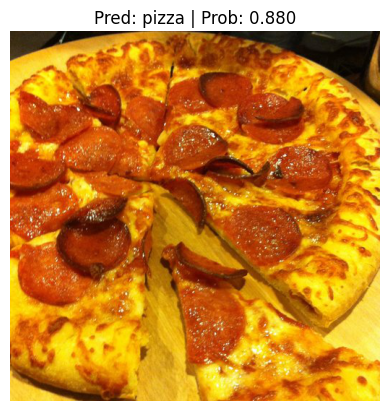

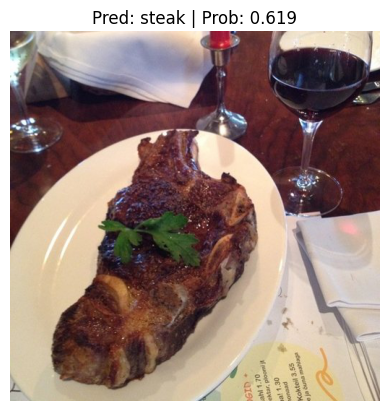

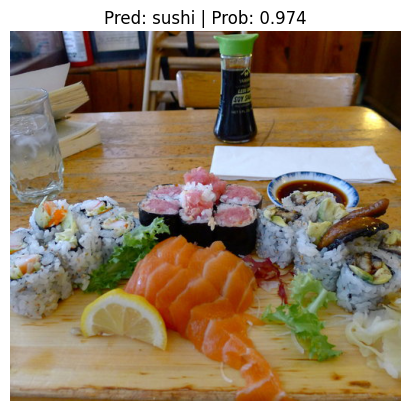

In [52]:
# Import function to make predictions on images and plot them 
from scripts.scripts.predictions import pred_and_plot_image

# Get a random list of 3 images from 20% test set
import random
num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg")) # get all test image paths from 20% dataset
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot) # randomly select k number of images

# Iterate through random test image paths, make predictions on them and plot them
for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        image_size=(224, 224))

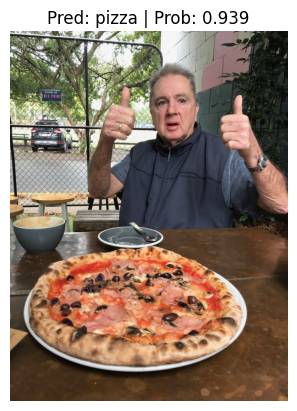

In [53]:
# Download custom image
import requests

# Setup custom image path
custom_image_path = Path("data/04-pizza-dad.jpeg")

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(model=model,
                    image_path=custom_image_path,
                    class_names=class_names)